## Advanced Lane Finding Project

In [3]:
#Needed packages

import numpy as np
import os
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from moviepy.editor import VideoFileClip
from collections import deque
import time

%matplotlib inline

In [4]:
#Define calibration chessboard parameters

# prepare object points
nx = 9 #the number of inside corners in x
ny = 6 #the number of inside corners in y

# prepare the empty vectors
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

10.74418119999973 seconds


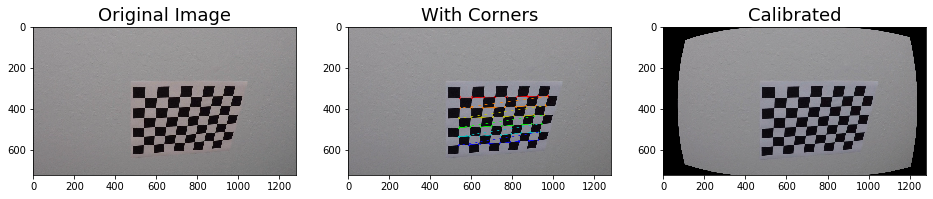

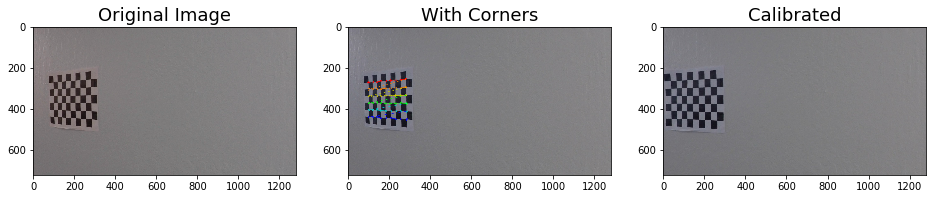

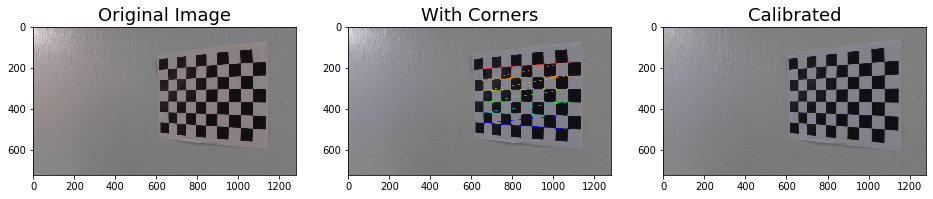

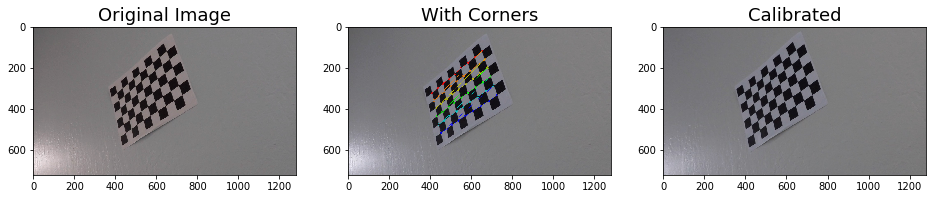

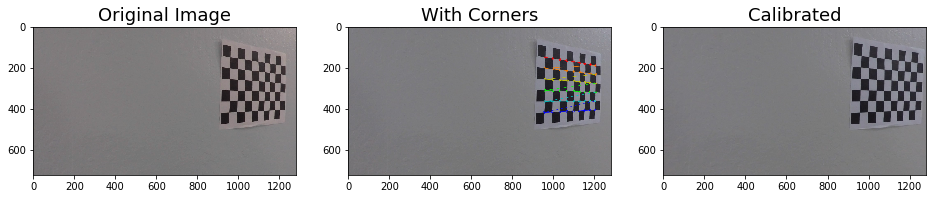

...

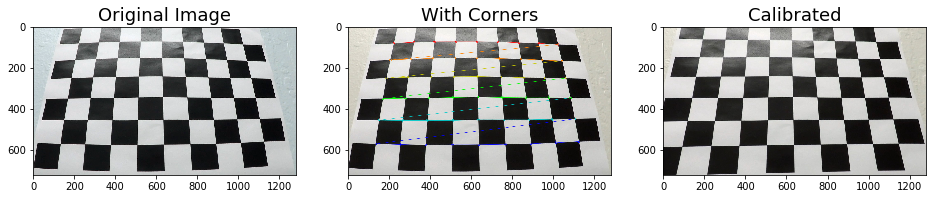

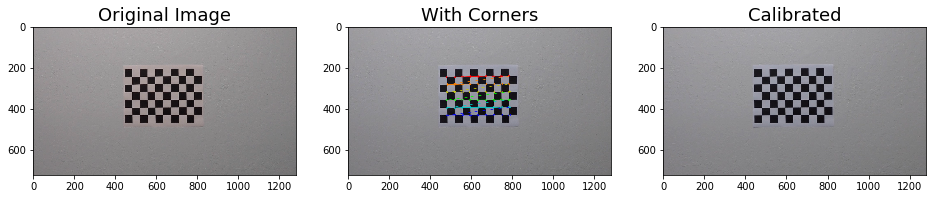

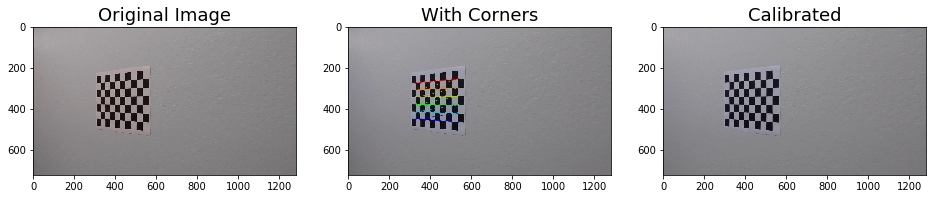

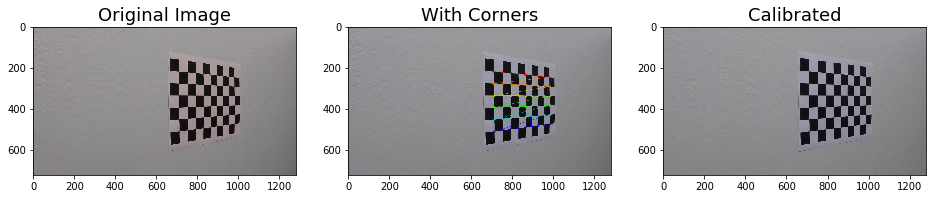

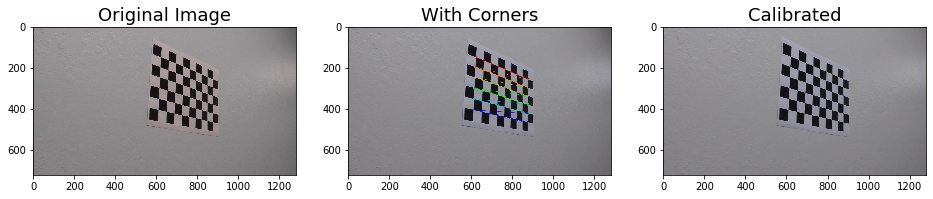

In [5]:
start_time = time.clock()
#Execute camera calibration to chessboard images to retrieve calibration matrix

# load the calibration images
images = glob.glob('camera_cal/calibration*.jpg')

for idx, fname in enumerate(images):
    
    #load images
    img = cv2.imread(fname)
    
    #Get the size of the image
    img_size = (img.shape[1], img.shape[0])
    
    #convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret2, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    # If found, add object points, image points
    if ret2 == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        
        # Calibrate the camera and undistort images
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
        undist = cv2.undistort(img, mtx, dist, None, mtx)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx,ny), corners, ret2)
    
        # Plot all 3 images
        f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,8))
        ax1.imshow(cv2.cvtColor(mpimg.imread(fname), cv2.COLOR_BGR2RGB))
    
        # Original
        ax1.set_title('Original Image', fontsize=18)
        ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    
        # Chessboards
        ax2.set_title('With Corners', fontsize=18)
    
        # Undistorted
        ax3.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
        ax3.set_title('Calibrated', fontsize=18)

        # Save the images for the Project Markup
        write_name_chess = 'output_images/chessboard_outputs/corners_found'+str(idx)+'.jpg'
        cv2.imwrite(write_name_chess, img)
        # Save the images for the Project Markup
        write_name_undist = 'output_images/chessboard_calibrated/calibrated_'+str(idx)+'.jpg'
        cv2.imwrite(write_name_undist, undist)

print (time.clock() - start_time, "seconds")

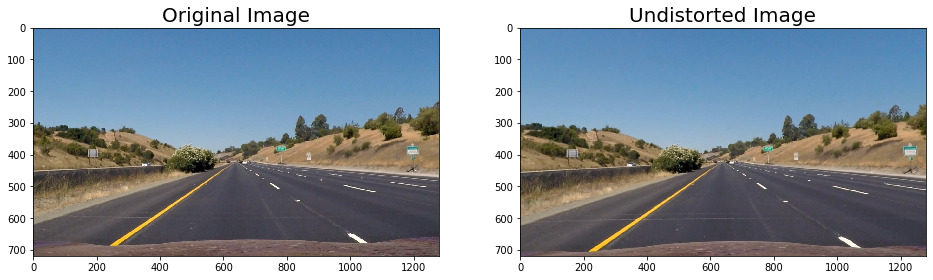

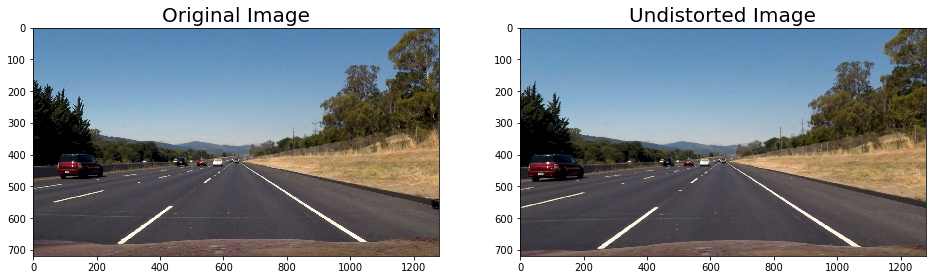

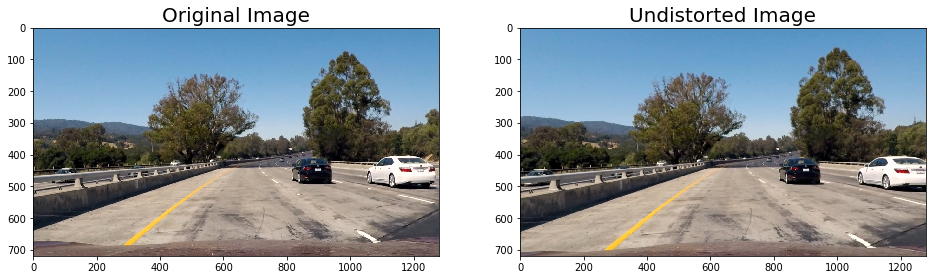

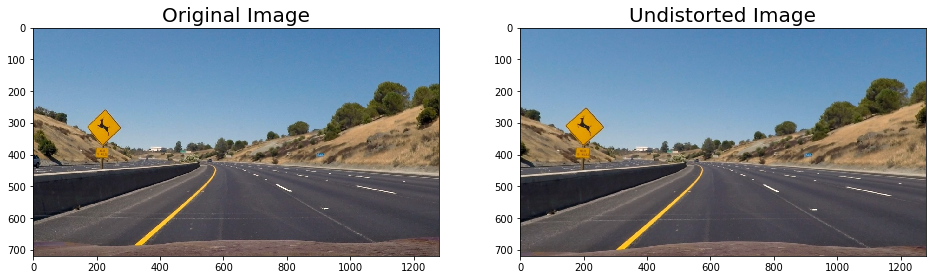

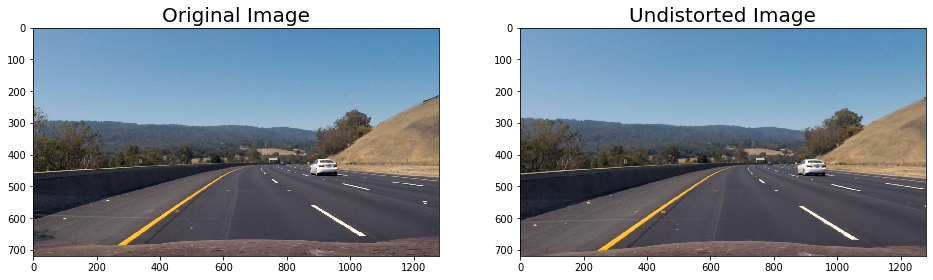

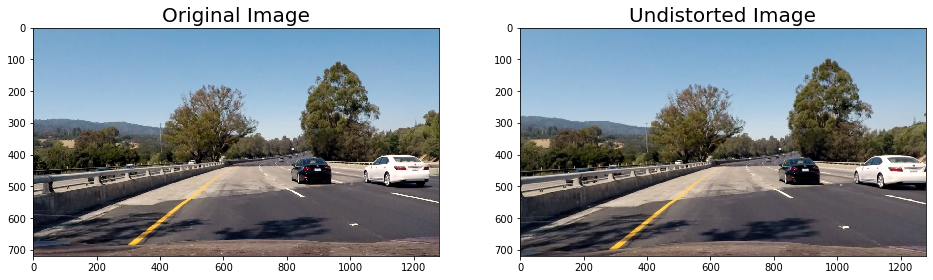

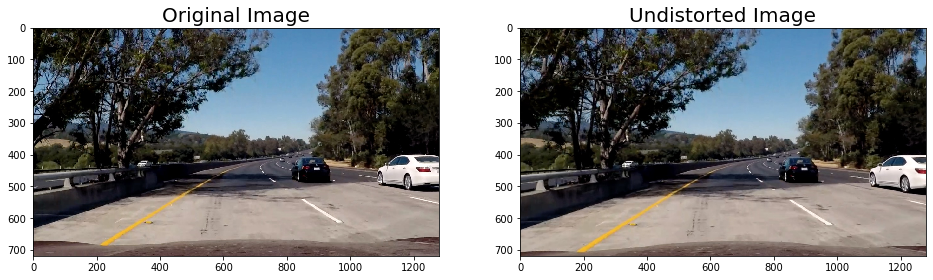

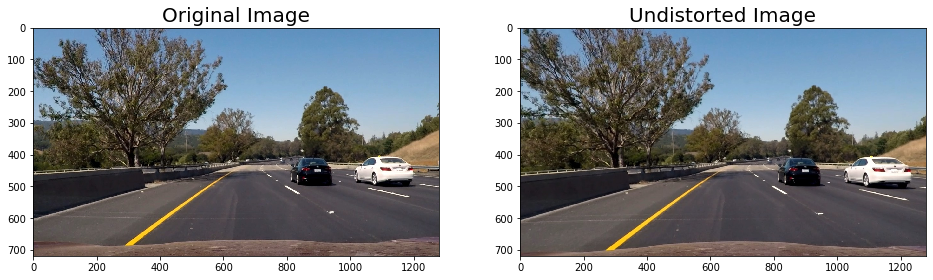

In [6]:
# Now with the retrieved distortion matrix, process the road images

# load the road images
images = glob.glob('test_images/*.jpg')

for idx, fname in enumerate(images):
    
    fname2 = os.path.basename(fname)
    
    img = cv2.imread(fname)
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
   
    #if show:
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
    ax2.set_title('Undistorted Image', fontsize=20)
    
    # Save the images for the Project Markup
    write_name_road = 'output_images/test_images/undist_'+fname2+'.jpg'
    cv2.imwrite(write_name_road, undist)


In [39]:
# Define function "Remove distortion from images"
def undistort(image, show=True, write=False):
    
    img = cv2.imread(image)
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)    
    
  
    if show:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))
        ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax1.set_title('Original Image', fontsize=20)
        ax2.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
        ax2.set_title('Undistorted Image', fontsize=20)
        
    if write:
        fname2 = os.path.basename(image)
        write_name_road = 'output_images/test_images/undist_'+fname2+'.jpg'
        cv2.imwrite(write_name_road, undist)

    else:
        return undist

# Define the function perspective transform

def warped(image, show=True, write=False):

    undist = undistort(image, show = False, write = False)
    img_size = (undist.shape[1], undist.shape[0])
    offset = 0
    
    # Define the 4 corners of the trapezoid, source
    top_left =    [580,460]               #these values get a better performance for the warping but
    bottom_left =  [203,720]             #in the pipeline they totally distort one of the lane output
    bottom_right = [1127,720]
    top_right=      [705,460]
    
    #top_left =    [490,482]
    #top_right =     [810,482]
    #bottom_right = [1250,720]
    #bottom_left=   [40,720]
    
    #trapezoid_src = [top_right,top_left,bottom_right,bottom_left]
    x_values_src = [top_left[0],bottom_left[0],bottom_right[0],top_right[0],top_left[0]]
    y_values_src = [top_left[1],bottom_left[1],bottom_right[1],top_right[1],top_left[1]]
    
    # Define the 4 corners of the trapezoid, warped
    top_left_dst =        [320,0]         #these values get a better performance for the warping but
    bottom_left_dst =     [320,720]       #in the pipeline they totally distort one of the lane output  
    bottom_right_dst =    [960,720]
    top_right_dst=        [960,0]
    
    #top_left_dst =    [0,0]
    #top_right_dst =     [1280,0]
    #bottom_right_dst = [1250,720]
    #bottom_left_dst=   [40,720]
    
    #trapezoid_dst = [top_right_dst,top_left_dst,bottom_right_dst,bottom_left_dst]
    x_values_dst = [top_left_dst[0],bottom_left_dst[0],bottom_right_dst[0],top_right_dst[0],top_left_dst[0]]
    y_values_dst = [top_left_dst[1],bottom_left_dst[1],bottom_right_dst[1],top_right_dst[1],top_left_dst[1]]

    # Define the trapezoids, source and destination
    src = np.float32([[top_right],[top_left],[bottom_right],[bottom_left]])
    dst = np.float32([[top_right_dst],[top_left_dst],[bottom_right_dst],[bottom_left_dst]])
    
    # Transform the image
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(undist, M, img_size)
    
    # Calculate the inverse transformation matrix too
    M_inv = cv2.getPerspectiveTransform(dst, src) 
    
    if show:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
        f.tight_layout()
        
        ax1.set_title('Undistorted Image', fontsize=20)
        ax1.plot(x_values_src,y_values_src,'r-',lw=2)
        ax1.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
        
        
        ax2.set_title('Undistorted and Warped Image', fontsize=20)
        ax2.plot(x_values_dst,y_values_dst,'r-',lw=2)
        ax2.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
        
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    if write:
        # Save the images for the Project Markup
        fname2 = os.path.basename(image)
        write_name_warped = 'output_images/test_images/warped_'+fname2+'.jpg'
        cv2.imwrite(write_name_warped, warped)
        
    else:
        return warped, M, M_inv

straight_lines1.jpg
0.9554268000001684 seconds
straight_lines2.jpg
1.9336702999999034 seconds
test1.jpg
2.9196663000002445 seconds
test2.jpg
3.8936270000003788 seconds
test3.jpg
4.839032400000178 seconds
test4.jpg
5.77479620000031 seconds
test5.jpg
6.704498899999635 seconds
test6.jpg
7.616425799999888 seconds


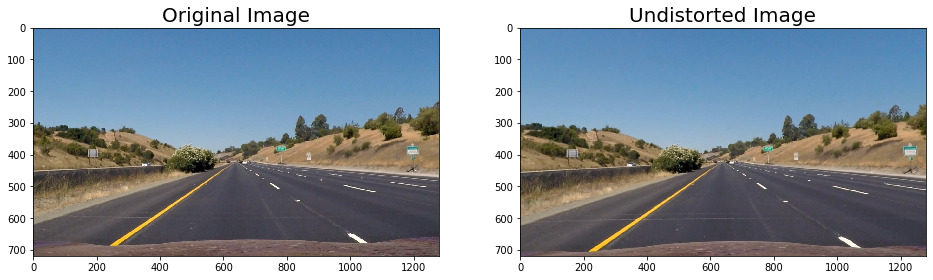

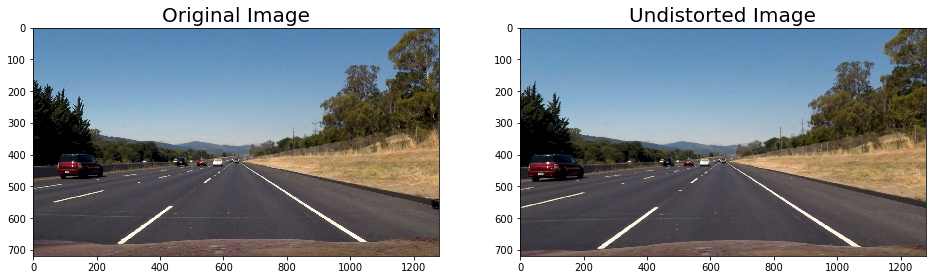

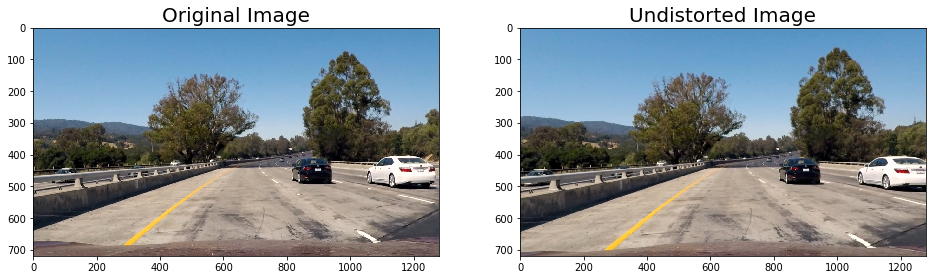

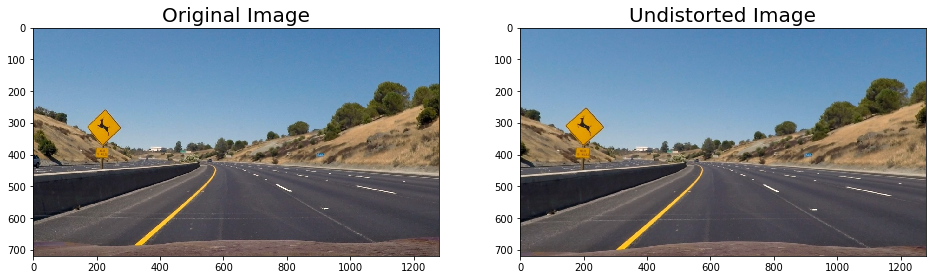

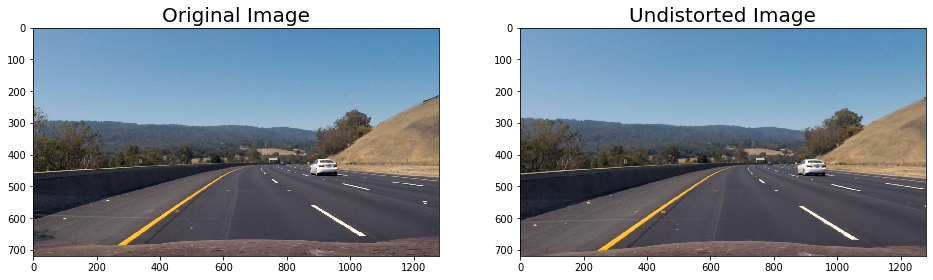

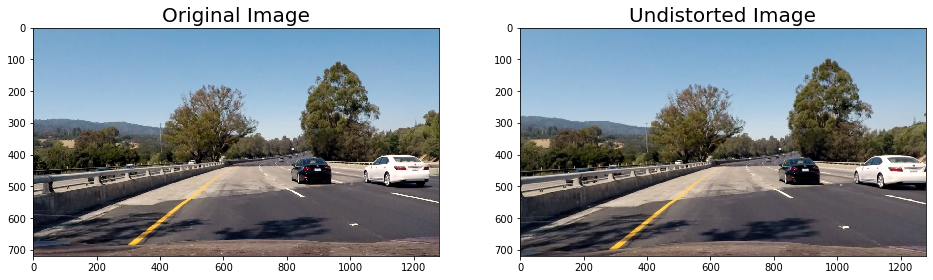

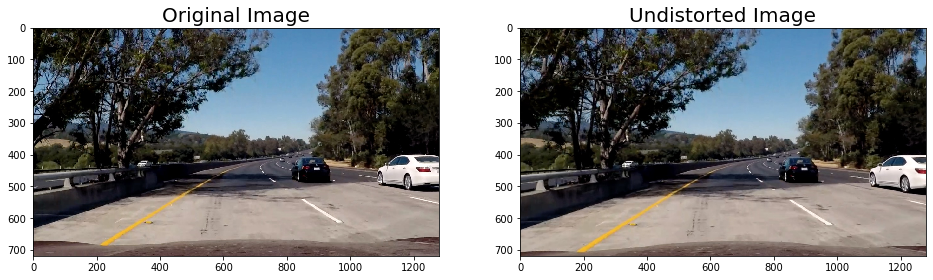

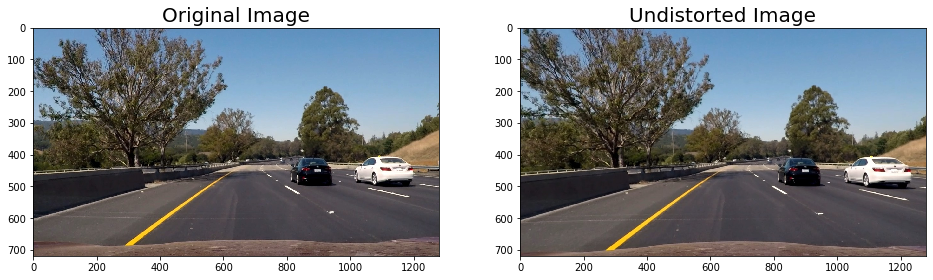

In [40]:
start_time = time.clock()
# Now try on the road images
images = glob.glob('test_images/*.jpg')

for image in images:
    print(os.path.basename(image))
    undistort(image)
    print (time.clock() - start_time, "seconds")

straight_lines1.jpg
1.0248630000005505 seconds
straight_lines2.jpg
2.1580665999999837 seconds
test1.jpg
3.2094030999996903 seconds
test2.jpg
4.251981600000363 seconds
test3.jpg
5.275069799999983 seconds
test4.jpg
6.31576430000041 seconds
test5.jpg
7.526017299999694 seconds
test6.jpg
8.566225800000211 seconds


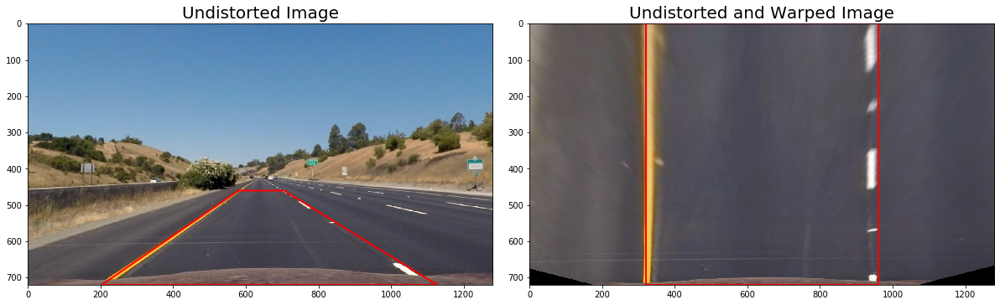

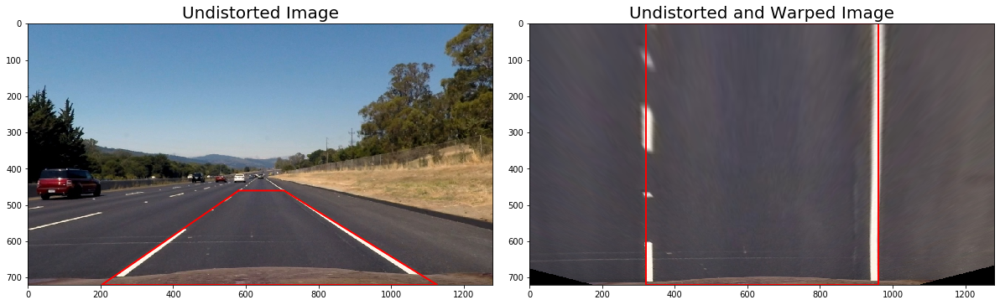

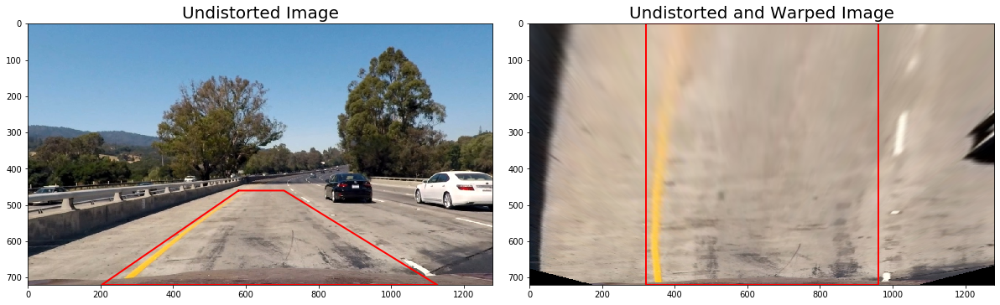

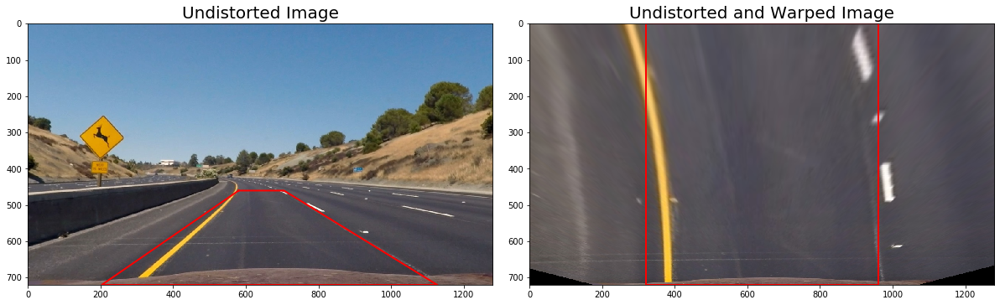

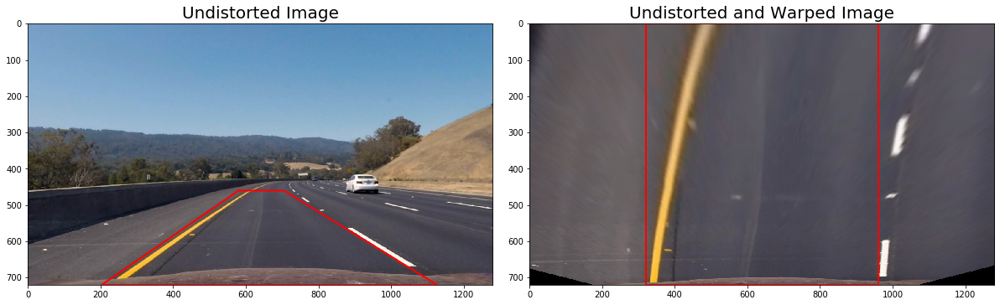

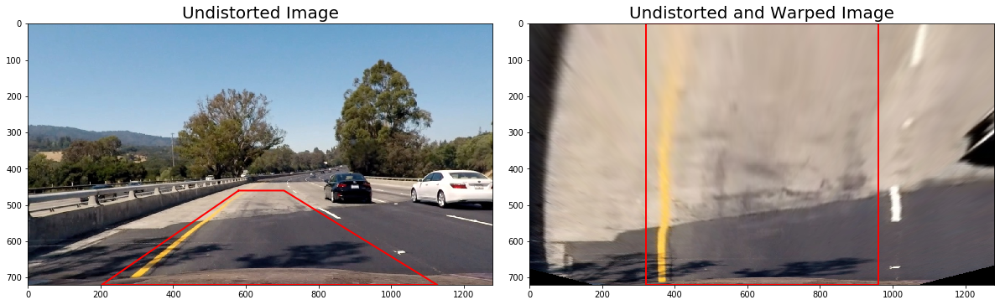

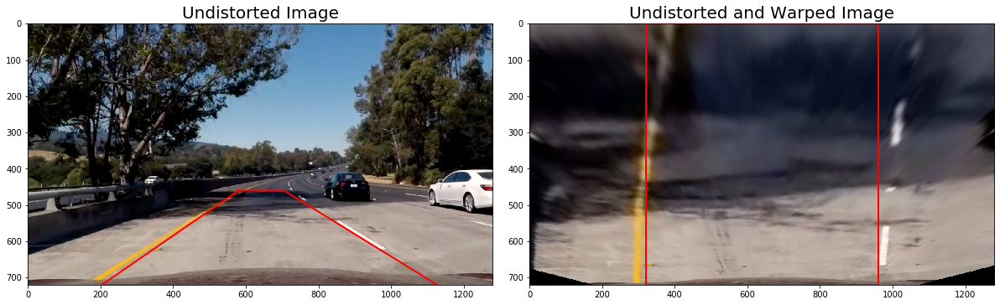

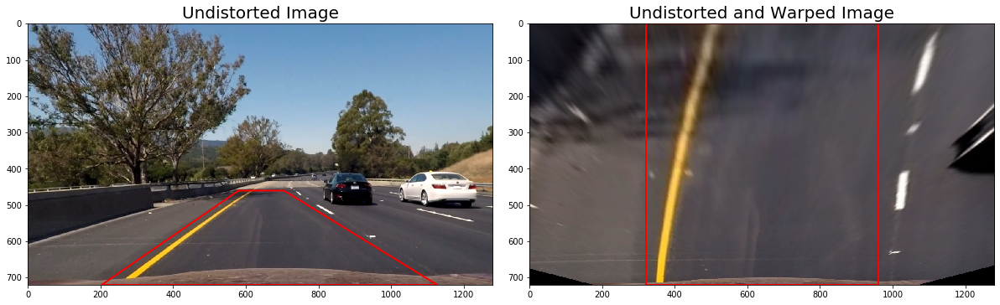

In [41]:
start_time = time.clock()
# And for the warping
images = glob.glob('test_images/*.jpg')

for image in images:
    print(os.path.basename(image))
    warped(image)
    print (time.clock() - start_time, "seconds")

In [42]:
def gradients(image, show=True, write=False):
    
    warped2, M, M_inv = warped(image, show=False, write=False)
    
    #Transform in HLS
    hls = cv2.cvtColor(warped2, cv2.COLOR_RGB2HLS)
    cie = cv2.cvtColor(warped2, cv2.COLOR_BGR2Lab)
    l_channel = hls[:,:,1]
    #s_channel = hls[:,:,2]
    b_channel = cie[:,:,2] 
   
    
    # Threshold color channel
    #s_thresh_min = 180
    #s_thresh_max = 255
    #s_binary = np.zeros_like(s_channel)
    #s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    
    b_thresh_min = 155
    b_thresh_max = 200
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= b_thresh_min) & (b_channel <= b_thresh_max)] = 1
    
    l_thresh_min = 225
    l_thresh_max = 255
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh_min) & (l_channel <= l_thresh_max)] = 1
    
    
    combined_binary = np.zeros_like(b_binary)
    combined_binary[(l_binary == 1) | (b_binary == 1)] = 1

    if show:
        # Plotting thresholded images
        f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey='col', sharex='row', figsize=(16,8))
        
        f.tight_layout()
        
        ax1.set_title('b binary threshold', fontsize=16)
        ax1.imshow(b_binary, cmap='gray')
        
        ax2.set_title('l binary threshold', fontsize=16)
        ax2.imshow(l_binary, cmap='gray')

        ax3.set_title('Combined color thresholds', fontsize=16)
        ax3.imshow(combined_binary, cmap='gray')
        
    
    if write:
        # Save the images for the Project Markup
        fname2 = os.path.basename(image)
        write_name_l_binary = 'output_images/test_images/l_binary_'+fname2+'.jpg'
        write_name_b_binary = 'output_images/test_images/b_binary_'+fname2+'.jpg'
        write_name_combined_binary = 'output_images/test_images/combined_binary_'+fname2+'.jpg'
        cv2.imwrite(write_name_l_binary, b_binary*255)
        cv2.imwrite(write_name_b_binary, l_binary*255)
        cv2.imwrite(write_name_combined_binary, combined_binary*255)
        
    else: 
        return combined_binary

straight_lines1.jpg
1.0458308999996007 seconds
straight_lines2.jpg
2.1299230000004172 seconds
test1.jpg
3.1687259000000267 seconds
test2.jpg
4.3586991000001944 seconds
test3.jpg
5.470231899999817 seconds
test4.jpg
6.489716400000361 seconds
test5.jpg
7.50646130000041 seconds
test6.jpg
8.525910199999998 seconds


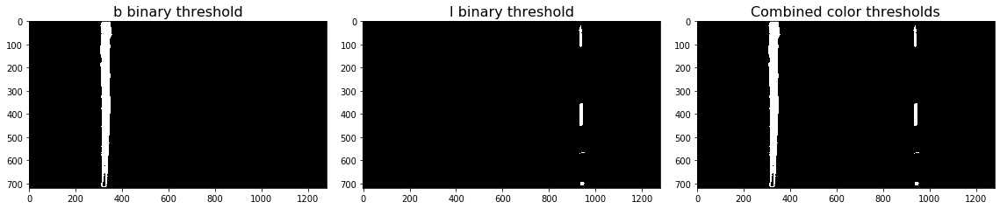

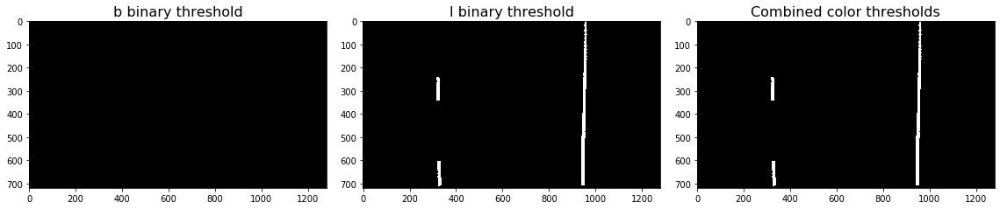

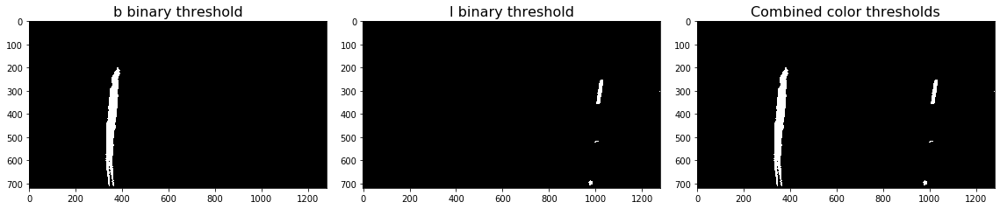

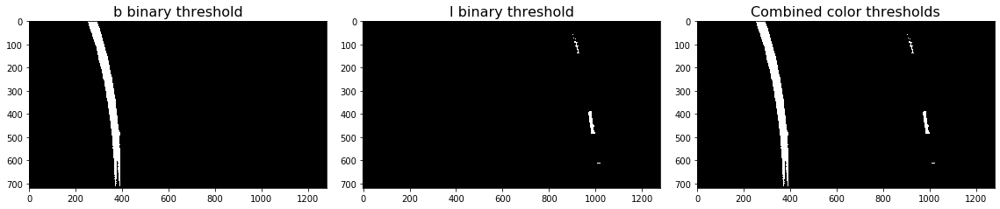

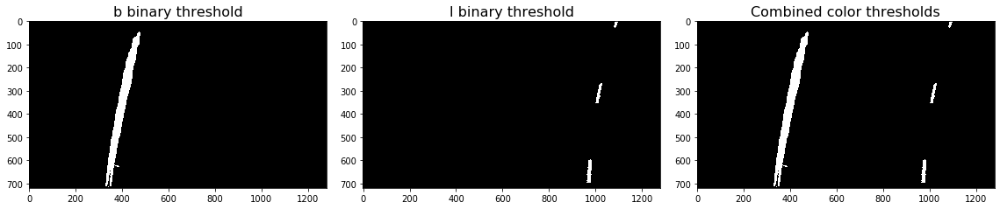

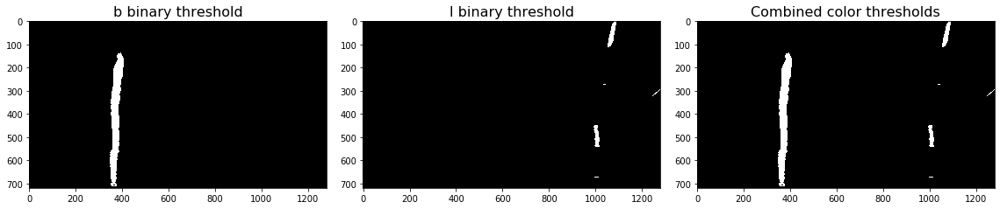

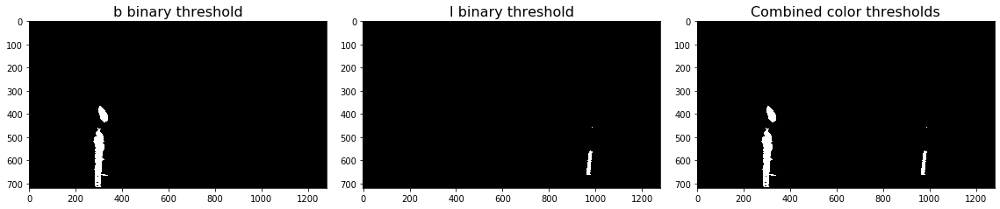

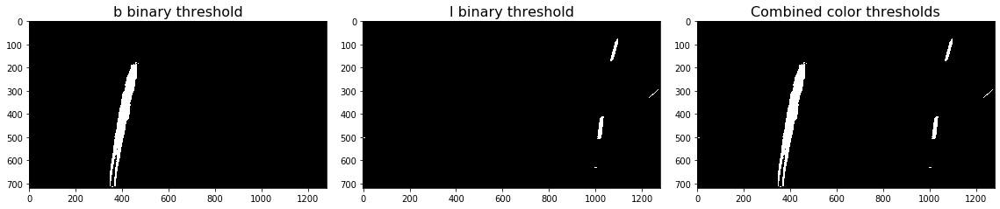

In [43]:
start_time = time.clock()
# And for the gradients
images = glob.glob('test_images/*.jpg')

for image in images:
    print(os.path.basename(image))
    gradients(image)
    print (time.clock() - start_time, "seconds")

In [44]:
def find_lane_pixels(image):
    
    binary_warped = gradients(image, show=False, write=False)
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 25

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img, binary_warped


def fit_polynomial(image, show=True, write=True):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img, binary_warped = find_lane_pixels(image)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, out_img.shape[0]-1, out_img.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
        
    # Measure Radius of Curvature for each lane line
    ym_per_pix = 30./720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    left_curverad = ((1 + (2*left_fit_cr[0]*np.max(lefty) + left_fit_cr[1])**2)**1.5) \
                                 /np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*np.max(lefty) + right_fit_cr[1])**2)**1.5) \
                                    /np.absolute(2*right_fit_cr[0])

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
        
    # Plots the left and right polynomials on the lane lines
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')
    
    if show:     
        
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
        f.tight_layout()
        
        ax1.set_title('Input Image', fontsize=20)
        ax1.imshow(binary_warped, cmap='gray')
        
        
        ax2.set_title('Found Lanes', fontsize=20)
        ax2 = plt.imshow(cv2.cvtColor(out_img, cv2.COLOR_BGR2RGB))
        plt.plot(left_fitx, ploty, color='yellow', lw=6)
        plt.plot(right_fitx, ploty, color='yellow', lw=6) #plot(x_values_dst,y_values_dst,'r-',lw=2)
        
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    if write:
        # Save the images for the Project Markup
        fname2 = os.path.basename(image)
        write_name_lane = 'output_images/test_images/lane_'+fname2+'.jpg'
        cv2.imwrite(write_name_lane,out_img)
        

    return out_img

straight_lines1.jpg
1.1654958999997689 seconds
straight_lines2.jpg
2.2572430000000168 seconds
test1.jpg
3.4558226999997714 seconds
test2.jpg
4.511526899999808 seconds
test3.jpg
5.563072099999772 seconds
test4.jpg
6.6093934999998964 seconds
test5.jpg
7.626595499999894 seconds
test6.jpg
8.666582599999856 seconds


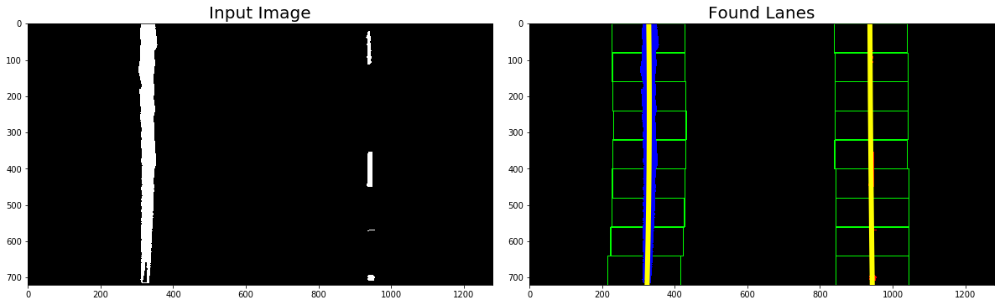

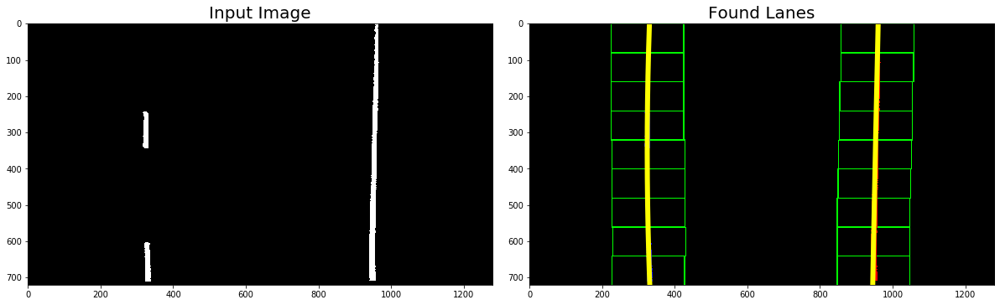

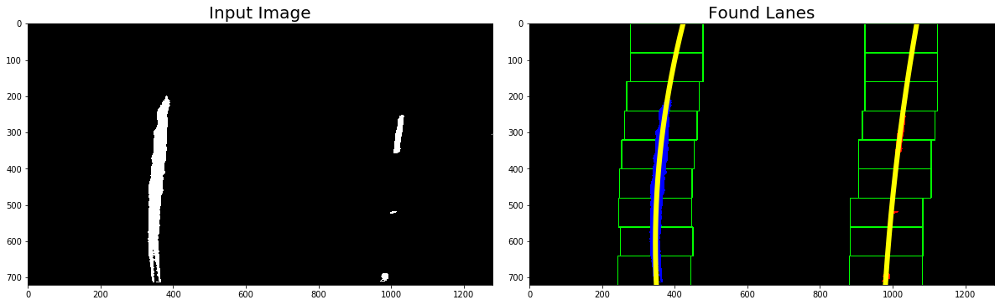

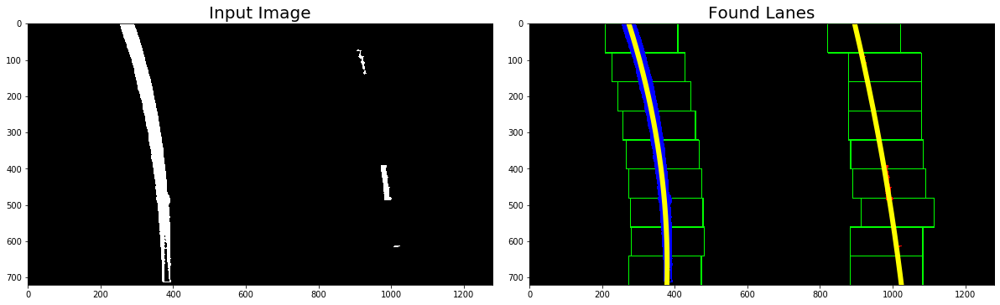

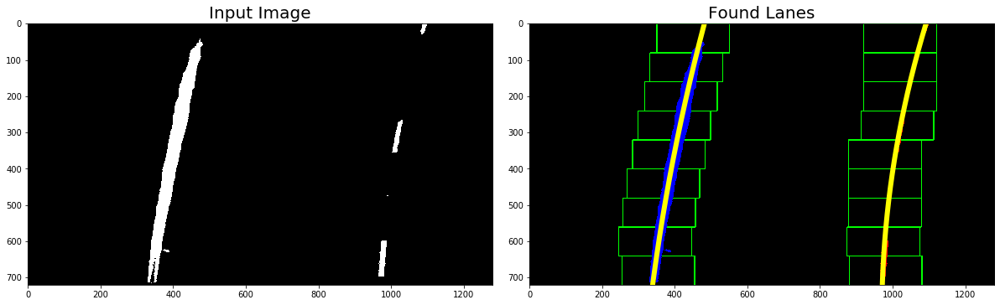

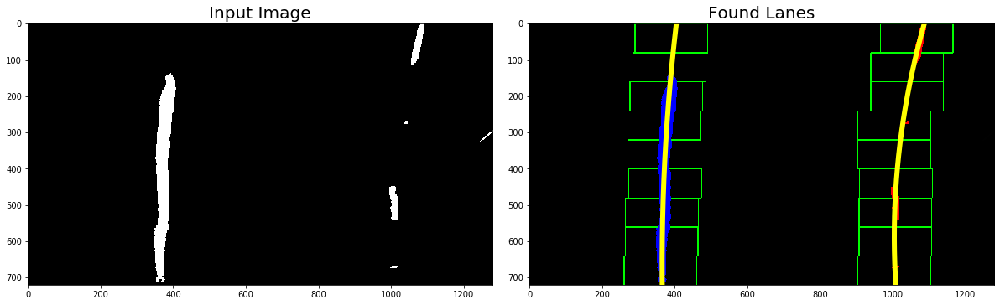

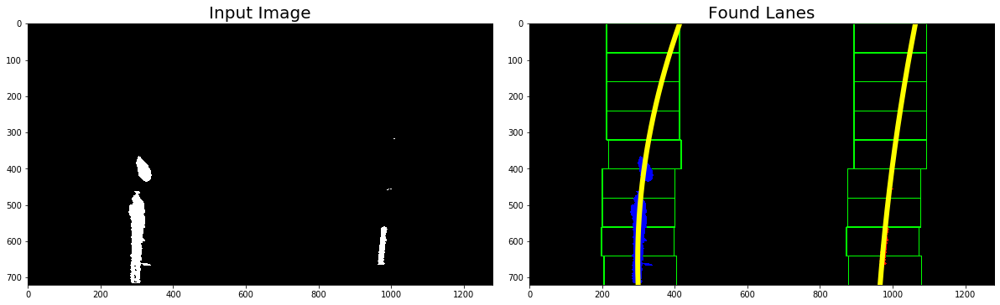

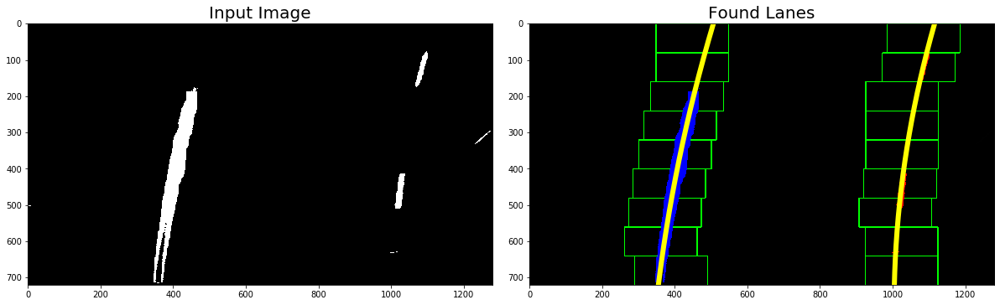

In [45]:
start_time = time.clock()
# And for the warping
images = glob.glob('test_images/*.jpg')

for image in images:
    print(os.path.basename(image))
    fit_polynomial(image)
    print (time.clock() - start_time, "seconds")

In [46]:
def fill_lane(image):
    
    combined_binary = gradients(image, show=False, write=False)
    
    rightx = []
    righty = []
    leftx = []
    lefty = []
    
    x, y = np.nonzero(np.transpose(combined_binary))
    i = 720
    j = 630
    while j >= 0:
        histogram = np.sum(combined_binary[j:i,:], axis=0)
        left_peak = np.argmax(histogram[:640])
        x_idx = np.where((((left_peak - 25) < x)&(x < (left_peak + 25))&((y > j) & (y < i))))
        x_window, y_window = x[x_idx], y[x_idx]
        if np.sum(x_window) != 0:
            leftx.extend(x_window.tolist())
            lefty.extend(y_window.tolist())

        right_peak = np.argmax(histogram[640:]) + 640
        x_idx = np.where((((right_peak - 25) < x)&(x < (right_peak + 25))&((y > j) & (y < i))))
        x_window, y_window = x[x_idx], y[x_idx]
        if np.sum(x_window) != 0:
            rightx.extend(x_window.tolist())
            righty.extend(y_window.tolist())
        i -= 90
        j -= 90

    lefty = np.array(lefty).astype(np.float32)
    leftx = np.array(leftx).astype(np.float32)
    righty = np.array(righty).astype(np.float32)
    rightx = np.array(rightx).astype(np.float32)
    
    left_fit = np.polyfit(lefty, leftx, 2)
    left_fitx = left_fit[0]*lefty**2 + left_fit[1]*lefty + left_fit[2]
    
    right_fit = np.polyfit(righty, rightx, 2)
    right_fitx = right_fit[0]*righty**2 + right_fit[1]*righty + right_fit[2]
    
    rightx_int = right_fit[0]*720**2 + right_fit[1]*720 + right_fit[2]
    
    rightx = np.append(rightx,rightx_int)
    righty = np.append(righty, 720)
    rightx = np.append(rightx,right_fit[0]*0**2 + right_fit[1]*0 + right_fit[2])
    righty = np.append(righty, 0)
    leftx_int = left_fit[0]*720**2 + left_fit[1]*720 + left_fit[2]
    leftx = np.append(leftx, leftx_int)
    lefty = np.append(lefty, 720)
    leftx = np.append(leftx,left_fit[0]*0**2 + left_fit[1]*0 + left_fit[2])
    lefty = np.append(lefty, 0)
    
    lsort = np.argsort(lefty)
    rsort = np.argsort(righty)
    
    lefty = lefty[lsort]
    leftx = leftx[lsort]
    
    righty = righty[rsort]
    rightx = rightx[rsort]
    
    left_fit = np.polyfit(lefty, leftx, 2)
    left_fitx = left_fit[0]*lefty**2 + left_fit[1]*lefty + left_fit[2]
    right_fit = np.polyfit(righty, rightx, 2)
    right_fitx = right_fit[0]*righty**2 + right_fit[1]*righty + right_fit[2]
    
    # Measure Radius of Curvature for each lane line
    ym_per_pix = 30./720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    left_curverad = ((1 + (2*left_fit_cr[0]*np.max(lefty) + left_fit_cr[1])**2)**1.5) \
                                 /np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*np.max(lefty) + right_fit_cr[1])**2)**1.5) \
                                    /np.absolute(2*right_fit_cr[0])
    
    
    # Calculate the position of the vehicle
    center = abs(640 - ((rightx_int+leftx_int)/2))
    
    offset = 0 
    img_size = (img.shape[1], img.shape[0])
    
    
    # Define the 4 corners of the trapezoid, source
    top_left =    [580,460]               #these values get a better performance for the warping but
    bottom_left =  [203,720]             #in the pipeline they totally distort one of the lane output
    bottom_right = [1127,720]
    top_right=      [705,460]
    
    #top_left =    [490,482]
    #top_right =     [810,482]
    #bottom_right = [1250,720]
    #bottom_left=   [40,720]
    
    #trapezoid_src = [top_right,top_left,bottom_right,bottom_left]
    x_values_src = [top_left[0],bottom_left[0],bottom_right[0],top_right[0],top_left[0]]
    y_values_src = [top_left[1],bottom_left[1],bottom_right[1],top_right[1],top_left[1]]
    
    # Define the 4 corners of the trapezoid, warped
    top_left_dst =        [320,0]         #these values get a better performance for the warping but
    bottom_left_dst =     [320,720]       #in the pipeline they totally distort the one of the lane output  
    bottom_right_dst =    [960,720]
    top_right_dst=        [960,0]
    
    #top_left_dst =    [0,0]
    #top_right_dst =     [1280,0]
    #bottom_right_dst = [1250,720]
    #bottom_left_dst=   [40,720]
    
    #trapezoid_dst = [top_right_dst,top_left_dst,bottom_right_dst,bottom_left_dst]
    x_values_dst = [top_left_dst[0],bottom_left_dst[0],bottom_right_dst[0],top_right_dst[0],top_left_dst[0]]
    y_values_dst = [top_left_dst[1],bottom_left_dst[1],bottom_right_dst[1],top_right_dst[1],top_left_dst[1]]

    # Define the trapezoids, source and destination
    src = np.float32([[top_right],[top_left],[bottom_right],[bottom_left]])
    dst = np.float32([[top_right_dst],[top_left_dst],[bottom_right_dst],[bottom_left_dst]])
    
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warp_zero = np.zeros_like(combined_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.flipud(np.transpose(np.vstack([left_fitx, lefty])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, righty]))])
    pts = np.hstack((pts_left, pts_right))
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    newwarp = cv2.warpPerspective(color_warp, Minv, (combined_binary.shape[1], combined_binary.shape[0]))
    result = cv2.addWeighted(mpimg.imread(image), 1, newwarp, 0.5, 0)
    
    f, (ax1, ax2) = plt.subplots(1,2, figsize=(16, 8))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor((warped(image, show=False, write=False)[0]), cv2.COLOR_BGR2RGB))
    ax1.set_xlim(0, 1280)
    ax1.set_ylim(0, 720)
    ax1.plot(left_fitx, lefty, color='green', linewidth=3)
    ax1.plot(right_fitx, righty, color='green', linewidth=3)
    ax1.set_title('Fit Polynomial to Lane Lines', fontsize=16)
    ax1.invert_yaxis() # to visualize as we do the images
    ax2.imshow(result)
    ax2.set_title('Fill Lane Between Polynomials', fontsize=16)
    if center < 640:
        ax2.text(200, 100, 'Vehicle is {:.2f}m left of center'.format(center*3.7/700),style='italic', color='white', fontsize=10)
    else:
        ax2.text(200, 100, 'Vehicle is {:.2f}m right of center'.format(center*3.7/700),style='italic', color='white', fontsize=10)
        ax2.text(200, 175, 'Radius of curvature is {}m'.format(int((left_curverad + right_curverad)/2)),style='italic', color='white', fontsize=10)

straight_lines1.jpg
2.1347922000004473 seconds
straight_lines2.jpg
4.187034499999754 seconds
test1.jpg
6.177656900000329 seconds
test2.jpg
8.150217200000043 seconds
test3.jpg
10.087056100000154 seconds
test4.jpg
11.99023920000036 seconds
test5.jpg
13.982536999999866 seconds
test6.jpg
15.960378699999637 seconds


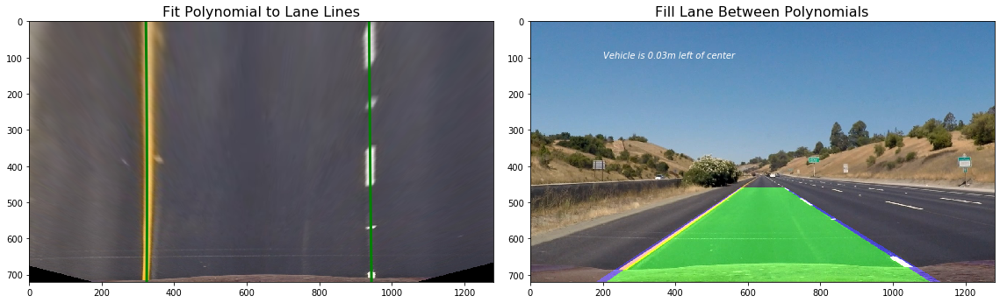

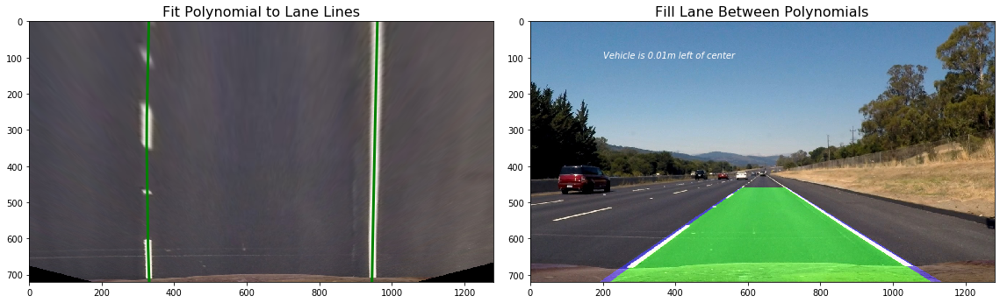

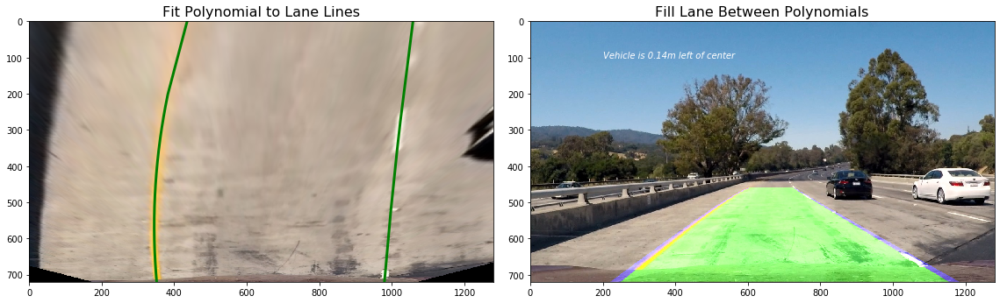

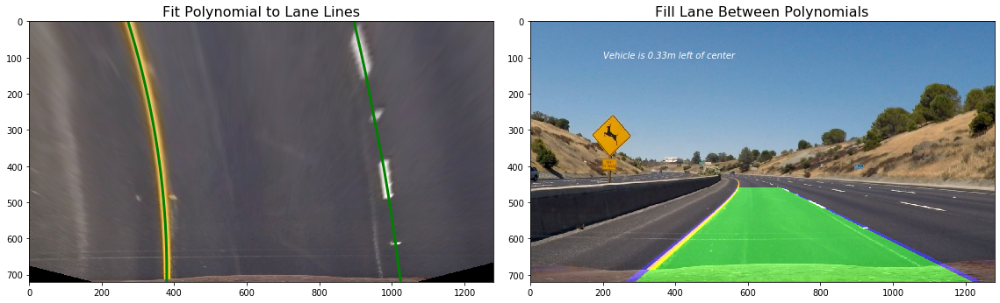

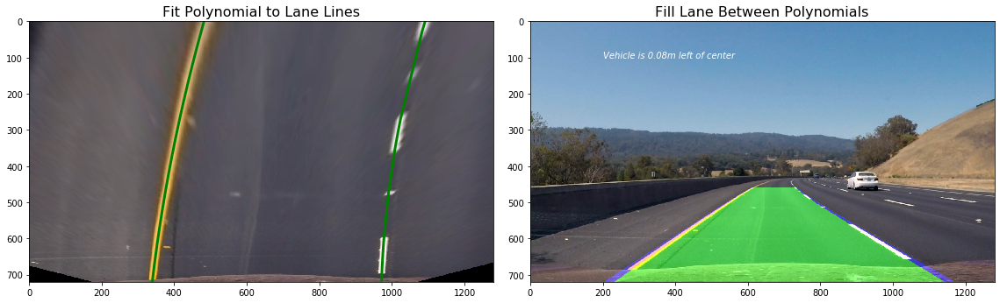

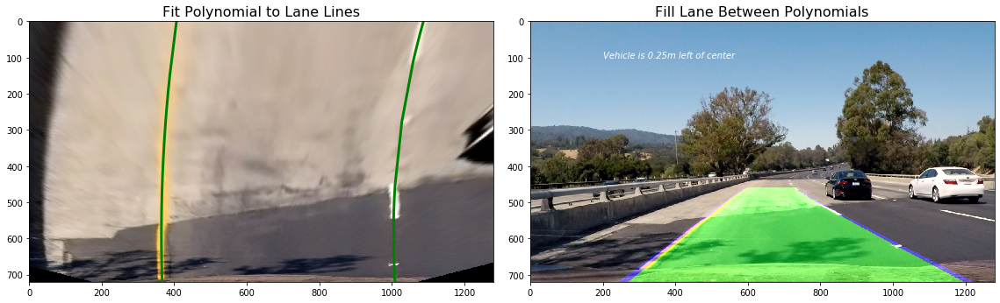

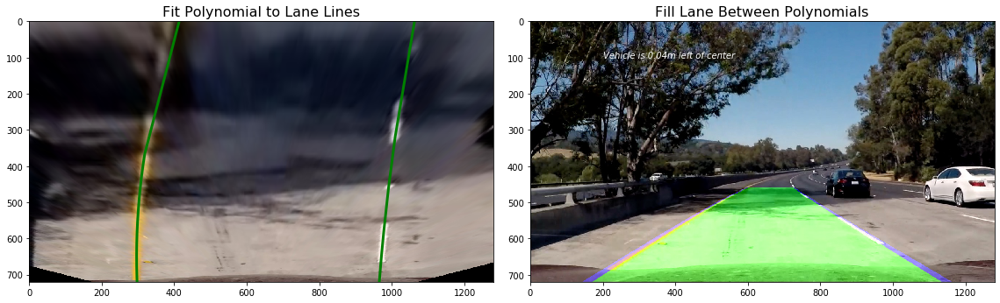

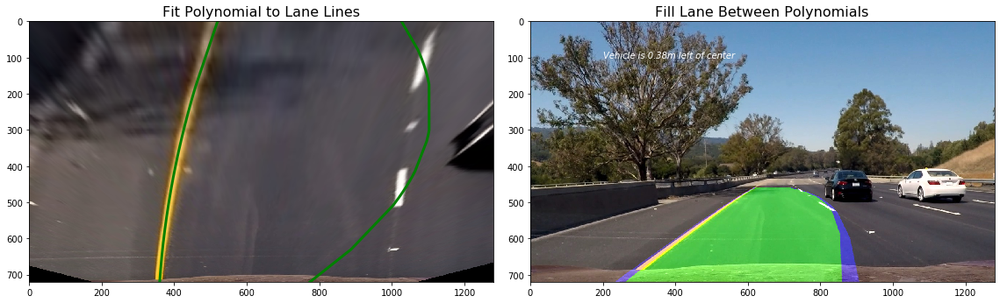

In [47]:
start_time = time.clock()
for image in glob.glob('test_images/*.jpg'):
    print(os.path.basename(image))
    fill_lane(image)
    print (time.clock() - start_time, "seconds")

In [48]:
class Line:
    def __init__(self):
        # Was the line found in the previous frame?
        self.found = False
        
        # Remember x and y values of lanes in previous frame
        self.X = None
        self.Y = None
        
        # Store recent x intercepts for averaging across frames
        self.x_int = deque(maxlen=10)
        self.top = deque(maxlen=10)
        
        # Remember previous x intercept to compare against current one
        self.lastx_int = None
        self.last_top = None
        
        # Remember radius of curvature
        self.radius = None
        
        # Store recent polynomial coefficients for averaging across frames
        self.fit0 = deque(maxlen=10)
        self.fit1 = deque(maxlen=10)
        self.fit2 = deque(maxlen=10)
        self.fitx = None
        self.pts = []
        
        # Count the number of frames
        self.count = 0
        
    def found_search(self, x, y):
        '''
        This function is applied when the lane lines have been detected in the previous frame.
        It uses a sliding window to search for lane pixels in close proximity (+/- 25 pixels in the x direction)
        around the previous detected polynomial. 
        '''
        xvals = []
        yvals = []
        if self.found == True: 
            i = 720
            j = 630
            while j >= 0:
                yval = np.mean([i,j])
                xval = (np.mean(self.fit0))*yval**2 + (np.mean(self.fit1))*yval + (np.mean(self.fit2))
                x_idx = np.where((((xval - 25) < x)&(x < (xval + 25))&((y > j) & (y < i))))
                x_window, y_window = x[x_idx], y[x_idx]
                if np.sum(x_window) != 0:
                    np.append(xvals, x_window)
                    np.append(yvals, y_window)
                i -= 90
                j -= 90
        if np.sum(xvals) == 0: 
            self.found = False # If no lane pixels were detected then perform blind search
        return xvals, yvals, self.found
    
    def blind_search(self, x, y, image):
        '''
        This function is applied in the first few frames and/or if the lane was not successfully detected
        in the previous frame. It uses a slinding window approach to detect peaks in a histogram of the
        binary thresholded image. Pixels in close proimity to the detected peaks are considered to belong
        to the lane lines.
        '''
        xvals = []
        yvals = []
        if self.found == False: 
            i = 720
            j = 630
            while j >= 0:
                histogram = np.sum(image[j:i,:], axis=0)
                if self == Right:
                    peak = np.argmax(histogram[640:]) + 640
                else:
                    peak = np.argmax(histogram[:640])
                x_idx = np.where((((peak - 25) < x)&(x < (peak + 25))&((y > j) & (y < i))))
                x_window, y_window = x[x_idx], y[x_idx]
                if np.sum(x_window) != 0:
                    xvals.extend(x_window)
                    yvals.extend(y_window)
                i -= 90
                j -= 90
        if np.sum(xvals) > 0:
            self.found = True
        else:
            yvals = self.Y
            xvals = self.X
        return xvals, yvals, self.found
    
    def radius_of_curvature(self, xvals, yvals):
        ym_per_pix = 30./720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meteres per pixel in x dimension
        fit_cr = np.polyfit(yvals*ym_per_pix, xvals*xm_per_pix, 2)
        curverad = ((1 + (2*fit_cr[0]*np.max(yvals) + fit_cr[1])**2)**1.5)/np.absolute(2*fit_cr[0])
        return curverad
    
    def sort_vals(self, xvals, yvals):
        sorted_index = np.argsort(yvals)
        sorted_yvals = yvals[sorted_index]
        sorted_xvals = xvals[sorted_index]
        return sorted_xvals, sorted_yvals
    
    def get_intercepts(self, polynomial):
        bottom = polynomial[0]*720**2 + polynomial[1]*720 + polynomial[2]
        top = polynomial[0]*0**2 + polynomial[1]*0 + polynomial[2]
        return bottom, top

In [49]:
# Video Processing Pipeline
def process_vid(image):
    img_size = (image.shape[1], image.shape[0])
    
    # Calibrate camera and undistort image
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    
    # Perform perspective transform
    offset = 0
    
    # Define the 4 corners of the trapezoid, source
    top_left =    [580,460]               #these values get a better performance for the warping
    bottom_left =  [203,720]             
    bottom_right = [1127,720]
    top_right=      [705,460]
    
    #top_left =    [490,482]
    #top_right =     [810,482]
    #bottom_right = [1250,720]
    #bottom_left=   [40,720]
    
    #trapezoid_src = [top_right,top_left,bottom_right,bottom_left]
    x_values_src = [top_left[0],bottom_left[0],bottom_right[0],top_right[0],top_left[0]]
    y_values_src = [top_left[1],bottom_left[1],bottom_right[1],top_right[1],top_left[1]]
    
    # Define the 4 corners of the trapezoid, warped
    top_left_dst =        [320,0]         #these values get a better performance for the warping
    bottom_left_dst =     [320,720]         
    bottom_right_dst =    [960,720]
    top_right_dst=        [960,0]
    
    #top_left_dst =    [0,0]
    #top_right_dst =     [1280,0]
    #bottom_right_dst = [1250,720]
    #bottom_left_dst=   [40,720]
    
    #trapezoid_dst = [top_right_dst,top_left_dst,bottom_right_dst,bottom_left_dst]
    x_values_dst = [top_left_dst[0],bottom_left_dst[0],bottom_right_dst[0],top_right_dst[0],top_left_dst[0]]
    y_values_dst = [top_left_dst[1],bottom_left_dst[1],bottom_right_dst[1],top_right_dst[1],top_left_dst[1]]


    # Define the trapezoids, source and destination
    src = np.float32([[top_right],[top_left],[bottom_right],[bottom_left]])
    dst = np.float32([[top_right_dst],[top_left_dst],[bottom_right_dst],[bottom_left_dst]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(undist, M, img_size)
    
    # Generate binary thresholded images
    b_channel = cv2.cvtColor(warped, cv2.COLOR_RGB2Lab)[:,:,2]
    l_channel = cv2.cvtColor(warped, cv2.COLOR_RGB2LUV)[:,:,0]  
    
    # Set the upper and lower thresholds for the b channel
    b_thresh_min = 145
    b_thresh_max = 200
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= b_thresh_min) & (b_channel <= b_thresh_max)] = 1
    
    # Set the upper and lower thresholds for the l channel
    l_thresh_min = 215
    l_thresh_max = 255
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh_min) & (l_channel <= l_thresh_max)] = 1

    combined_binary = np.zeros_like(b_binary)
    combined_binary[(l_binary == 1) | (b_binary == 1)] = 1
    
    # Identify all non zero pixels in the image
    x, y = np.nonzero(np.transpose(combined_binary)) 

    if Left.found == True: # Search for left lane pixels around previous polynomial
        leftx, lefty, Left.found = Left.found_search(x, y)
        
    if Right.found == True: # Search for right lane pixels around previous polynomial
        rightx, righty, Right.found = Right.found_search(x, y)

            
    if Right.found == False: # Perform blind search for right lane lines
        rightx, righty, Right.found = Right.blind_search(x, y, combined_binary)
            
    if Left.found == False:# Perform blind search for left lane lines
        leftx, lefty, Left.found = Left.blind_search(x, y, combined_binary)

    lefty = np.array(lefty).astype(np.float32)
    leftx = np.array(leftx).astype(np.float32)
    righty = np.array(righty).astype(np.float32)
    rightx = np.array(rightx).astype(np.float32)
            
    # Calculate left polynomial fit based on detected pixels
    left_fit = np.polyfit(lefty, leftx, 2)
    
    # Calculate intercepts to extend the polynomial to the top and bottom of warped image
    leftx_int, left_top = Left.get_intercepts(left_fit)
    
    # Average intercepts across n frames
    Left.x_int.append(leftx_int)
    Left.top.append(left_top)
    leftx_int = np.mean(Left.x_int)
    left_top = np.mean(Left.top)
    Left.lastx_int = leftx_int
    Left.last_top = left_top
    
    # Add averaged intercepts to current x and y vals
    leftx = np.append(leftx, leftx_int)
    lefty = np.append(lefty, 720)
    leftx = np.append(leftx, left_top)
    lefty = np.append(lefty, 0)
    
    # Sort detected pixels based on the yvals
    leftx, lefty = Left.sort_vals(leftx, lefty)
    
    Left.X = leftx
    Left.Y = lefty
    
    # Recalculate polynomial with intercepts and average across n frames
    left_fit = np.polyfit(lefty, leftx, 2)
    Left.fit0.append(left_fit[0])
    Left.fit1.append(left_fit[1])
    Left.fit2.append(left_fit[2])
    left_fit = [np.mean(Left.fit0), 
                np.mean(Left.fit1), 
                np.mean(Left.fit2)]
    
    # Fit polynomial to detected pixels
    left_fitx = left_fit[0]*lefty**2 + left_fit[1]*lefty + left_fit[2]
    Left.fitx = left_fitx
    
    # Calculate right polynomial fit based on detected pixels
    right_fit = np.polyfit(righty, rightx, 2)

    # Calculate intercepts to extend the polynomial to the top and bottom of warped image
    rightx_int, right_top = Right.get_intercepts(right_fit)
    
    # Average intercepts across 5 frames
    Right.x_int.append(rightx_int)
    rightx_int = np.mean(Right.x_int)
    Right.top.append(right_top)
    right_top = np.mean(Right.top)
    Right.lastx_int = rightx_int
    Right.last_top = right_top
    rightx = np.append(rightx, rightx_int)
    righty = np.append(righty, 720)
    rightx = np.append(rightx, right_top)
    righty = np.append(righty, 0)
    
    # Sort right lane pixels
    rightx, righty = Right.sort_vals(rightx, righty)
    Right.X = rightx
    Right.Y = righty
    
    # Recalculate polynomial with intercepts and average across n frames
    right_fit = np.polyfit(righty, rightx, 2)
    Right.fit0.append(right_fit[0])
    Right.fit1.append(right_fit[1])
    Right.fit2.append(right_fit[2])
    right_fit = [np.mean(Right.fit0), np.mean(Right.fit1), np.mean(Right.fit2)]
    
    # Fit polynomial to detected pixels
    right_fitx = right_fit[0]*righty**2 + right_fit[1]*righty + right_fit[2]
    Right.fitx = right_fitx
        
    # Compute radius of curvature for each lane in meters
    left_curverad = Left.radius_of_curvature(leftx, lefty)
    right_curverad = Right.radius_of_curvature(rightx, righty)
        
    # Only print the radius of curvature every 3 frames for improved readability
    if Left.count % 3 == 0:
        Left.radius = left_curverad
        Right.radius = right_curverad
        
    # Calculate the vehicle position relative to the center of the lane
    position = (rightx_int+leftx_int)/2
    distance_from_center = abs((640 - position)*3.7/700) 
    
    warp_zero = np.zeros_like(combined_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.flipud(np.transpose(np.vstack([Left.fitx, Left.Y])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, Right.Y]))])
    pts = np.hstack((pts_left, pts_right))
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_(pts), (34,255,34))
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0]))
    result = cv2.addWeighted(undist, 1, newwarp, 0.5, 0)
        
    # Print distance from center on video
    if position > 640:
        cv2.putText(result, 'Vehicle is {:.2f}m left of center'.format(distance_from_center), (100,80),
                 fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    else:
        cv2.putText(result, 'Vehicle is {:.2f}m right of center'.format(distance_from_center), (100,80),
                 fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    # Print radius of curvature on video
    cv2.putText(result, 'Radius of Curvature {}(m)'.format(int((Left.radius+Right.radius)/2)), (120,140),
             fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    Left.count += 1
    return result

In [54]:
start_time = time.clock()
Left = Line()
Right = Line()
video_output = 'result.mp4'
clip1 = VideoFileClip("project_video.mp4").subclip(0,2)
white_clip = clip1.fl_image(process_vid) 
white_clip.write_videofile(video_output, audio=False)
print (time.clock() - start_time, "seconds")

Moviepy - Building video result.mp4.
Moviepy - Writing video result.mp4



Moviepy - Done !
Moviepy - video ready result.mp4
51.05006180000055 seconds


In [55]:
from IPython.display import HTML
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format('result.mp4'))

In [56]:
start_time = time.clock()
Left = Line()
Right = Line()
challenge_output = 'challenge_result.mp4'
clip1 = VideoFileClip("challenge_video.mp4")
challenge_clip = clip1.fl_image(process_vid) 
challenge_clip.write_videofile(challenge_output, audio=False)
print (time.clock() - start_time, "seconds")

Moviepy - Building video challenge_result.mp4.
Moviepy - Writing video challenge_result.mp4



Moviepy - Done !
Moviepy - video ready challenge_result.mp4
524.8602121000004 seconds


In [57]:
from IPython.display import HTML
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format('challenge_result.mp4'))